In [ ]:
from obspy.io.segy.segy import _read_segy
import numpy as np
import matplotlib.pyplot as plt
import os
import glob

ruta = "/home/pc-2/Documents/CAVE_minciencias/utah_model/2D_seismic_data/2D/Correlated_Shot_Gathers/50_1511548939_30100_54100_20171127_150418_749.sgy"
st = _read_segy(ruta, headonly=False)

# Convertir a matriz
datos = np.array([tr.data for tr in st.traces])
n_trazas, n_muestras = datos.shape

# Opción A: usar el header de la traza
try:
    dt_microsec = st.traces[0].header.sample_interval_in_microseconds
    dt_ms = dt_microsec / 1000
except AttributeError:
    # Opción B: asumir duración total y calcular
    t_total_s = 4.0  # asumiendo 4 segundos
    dt_ms = (t_total_s / n_muestras) * 1000

# Estadísticas
min_amp = datos.min()
max_amp = datos.max()
mean_amp = datos.mean()
std_amp = datos.std()
t_total_ms = n_muestras * dt_ms

print(f"🔍 Estadísticas del Shot Gather:")
print(f" - Número de trazas           : {n_trazas}")
print(f" - Muestras por traza         : {n_muestras}")
print(f" - Intervalo de muestreo (ms) : {dt_ms}")
print(f" - Duración total (ms)        : {t_total_ms}")
print(f" - Amplitud mínima            : {min_amp}")
print(f" - Amplitud máxima            : {max_amp}")
print(f" - Amplitud media             : {mean_amp:.2f}")
print(f" - Desviación estándar        : {std_amp:.2f}")

# === Leer archivo con obspy ===
st = _read_segy(ruta, headonly=False)
datos = np.array([tr.data for tr in st.traces])
n_trazas, n_muestras = datos.shape

# === Tiempo (asumiendo 1 ms si no se puede extraer) ===
try:
    dt_ms = st.traces[0].header.sample_interval_in_microseconds / 1000
except:
    dt_ms = 1.0

tiempo = np.linspace(0, n_muestras * dt_ms, n_muestras)

# === Normalización por traza ===
datos_norm = datos / np.max(np.abs(datos), axis=1, keepdims=True)

# === Visualización ===
plt.figure(figsize=(12, 6))
plt.imshow(datos_norm.T, cmap='gray', aspect='auto',
           extent=[0, n_trazas, tiempo[-1], tiempo[0]],
           vmin=-1, vmax=1)
plt.xlabel("Número de traza")
plt.ylabel("Tiempo [ms]")
plt.title("Shot Gather normalizado por traza")
plt.colorbar(label="Amplitud normalizada")
plt.show()

# === Leer archivo SEG-Y migrado ===
ruta2 = "/home/pc-2/Documents/CAVE_minciencias/utah_model/2D_seismic_data/2D/Processed_Data/Forge2D-301_Migr-Depth.sgy"
st_mig = _read_segy(ruta2, headonly=False)

# === Convertir a matriz y normalizar ===
datos = np.array([tr.data for tr in st_mig.traces])
n_trazas, n_muestras = datos.shape
datos_norm = datos / np.max(np.abs(datos))

# === Graficar con escala de color sísmica (seismic) y exageración vertical ===
plt.figure(figsize=(40, 10))  # más alto para exagerar profundidad
plt.imshow(
    datos_norm.T,
    aspect=0.3,  # < 1 alarga en X, >1 alarga en Y
    cmap='seismic',
    interpolation='nearest',
    extent=[0, n_trazas, n_muestras, 0]  # muestra 0 en la parte superior
)
plt.xlabel("Número de traza")
plt.ylabel("Profundidad (muestras)")
plt.title("Sección Migrada en Profundidad (colores sísmicos)")
plt.colorbar(label="Amplitud normalizada")
plt.show()

In [ ]:
# # === Ruta base de entrada y salida ===
# ruta_base = "/home/pc-2/Documents/CAVE_minciencias/utah_model/2D_seismic_data/2D/Correlated_Shot_Gathers"
# carpeta_salida = os.path.join(ruta_base, "imagenes_shot_gathers")

# # === Crear carpeta de salida si no existe ===
# os.makedirs(carpeta_salida, exist_ok=True)

# # === Obtener archivos SEG-Y (puedes limitar si hay muchos) ===
# archivos_sgy = sorted(glob.glob(os.path.join(ruta_base, "*.sgy")))

# # === Procesar cada archivo ===
# for ruta in archivos_sgy:
#     try:
#         st = _read_segy(ruta, headonly=False)
#         datos = np.array([tr.data for tr in st.traces])
#         n_trazas, n_muestras = datos.shape

#         # Intervalo de muestreo
#         try:
#             dt_ms = st.traces[0].header.sample_interval_in_microseconds / 1000
#         except:
#             dt_ms = 1.0

#         tiempo = np.linspace(0, n_muestras * dt_ms, n_muestras)
#         datos_norm = datos / np.max(np.abs(datos), axis=1, keepdims=True)

#         # Visualización y guardado
#         nombre_archivo = os.path.basename(ruta).replace('.sgy', '.png')
#         ruta_salida = os.path.join(carpeta_salida, nombre_archivo)

#         plt.figure(figsize=(12, 6))
#         plt.imshow(datos_norm.T, cmap='gray', aspect='auto',
#                    extent=[0, n_trazas, tiempo[-1], tiempo[0]],
#                    vmin=-1, vmax=1)
#         plt.xlabel("Número de traza")
#         plt.ylabel("Tiempo [ms]")
#         plt.title(f"Shot Gather - {os.path.basename(ruta)}")
#         plt.colorbar(label="Amplitud normalizada")
#         plt.tight_layout()
#         plt.savefig(ruta_salida, dpi=300)
#         plt.close()

#     except Exception as e:
#         print(f"⚠️ Error en {ruta}: {e}")

In [ ]:
import os
import glob
import numpy as np
from obspy.io.segy.segy import _read_segy

def cargar_shot_gathers(ruta_carpeta, max_archivos=None):
    """
    Carga shot gathers desde archivos .segy y los convierte en un array numpy 3D.

    Parámetros:
    - ruta_carpeta: carpeta donde están los archivos .sgy
    - max_archivos: máximo número de archivos a leer (opcional)

    Retorna:
    - gathers: ndarray de shape (N_shots, height, width)
    """
    archivos = sorted(glob.glob(os.path.join(ruta_carpeta, "*.sgy")))
    if max_archivos:
        archivos = archivos[:max_archivos]

    lista_gathers = []
    for archivo in archivos:
        st = _read_segy(archivo, headonly=False)
        datos = np.array([tr.data for tr in st.traces])  # shape = (n_trazas, n_muestras)
        lista_gathers.append(datos)

    gathers = np.stack(lista_gathers, axis=0)
    return gathers



In [ ]:
ruta = "/home/pc-2/Documents/CAVE_minciencias/utah_model/2D_seismic_data/2D/Correlated_Shot_Gathers"
gathers = cargar_shot_gathers(ruta, max_archivos=200)
print("Shape:", gathers.shape)

In [ ]:
perc=0.9

def submuestrear_receptores_aleatorios(gathers, porcentaje=perc, random_seed=42):
    np.random.seed(random_seed)
    N_shots, n_receptores, n_muestras = gathers.shape
    n_remover = int(porcentaje * n_receptores)

    gathers_sub = gathers.copy()
    idxs_removidos = []

    for i in range(N_shots):
        idx_removidos = np.sort(np.random.choice(n_receptores, n_remover, replace=False))
        gathers_sub[i, idx_removidos, :] = 0  # esto anula columnas (receptores)
        idxs_removidos.append(idx_removidos)

    return gathers_sub, idxs_removidos

gathers_sub, idxs_removidos = submuestrear_receptores_aleatorios(gathers, porcentaje=perc)

# # Guardar los datos submuestreados
# np.save("gathers_sub_60pct.npy", gathers_sub)
# np.save("gathers_original.npy", gathers)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def visualizar_shot_con_normalizacion_por_traza(shot, dt_ms=1.0, cmap='gray'):
    """
    Visualiza un shot gather 2D (shape: trazas x muestras) normalizado por traza.
    
    Parámetros:
    - shot: ndarray de shape (n_trazas, n_muestras)
    - dt_ms: intervalo de muestreo en milisegundos
    - cmap: mapa de colores ('gray', 'seismic', etc.)
    """
    n_trazas, n_muestras = shot.shape
    tiempo = np.linspace(0, n_muestras * dt_ms, n_muestras)

    # Normalización por traza
    shot_norm = shot / (np.max(np.abs(shot), axis=1, keepdims=True) + 1e-6)

    plt.figure(figsize=(12, 6))
    plt.imshow(shot_norm.T, cmap=cmap, aspect='auto',
               extent=[0, n_trazas, tiempo[-1], tiempo[0]],
               vmin=-1, vmax=1)
    plt.xlabel("Número de traza")
    plt.ylabel("Tiempo [ms]")
    plt.title("Shot Gather normalizado por traza")
    plt.colorbar(label="Amplitud normalizada")
    plt.show()

# i = 0  # índice del shot a visualizar

# print("🔍 Shot original:")
# visualizar_shot_con_normalizacion_por_traza(gathers[i], dt_ms=1.0)

# print("🔍 Shot submuestreado:")
# visualizar_shot_con_normalizacion_por_traza(gathers_sub[i], dt_ms=1.0)


In [ ]:
# import torch
# import torch.nn as nn

# class UNet2DFull(nn.Module):
#     def __init__(self, in_channels=1, out_channels=1):
#         super(UNet2DFull, self).__init__()

#         def conv_block(in_c, out_c):
#             return nn.Sequential(
#                 nn.Conv2d(in_c, out_c, kernel_size=3, padding=1),
#                 nn.BatchNorm2d(out_c),
#                 nn.ReLU(inplace=True),
#                 nn.Conv2d(out_c, out_c, kernel_size=3, padding=1),
#                 nn.BatchNorm2d(out_c),
#                 nn.ReLU(inplace=True)
#             )

#         self.enc1 = conv_block(in_channels, 64)
#         self.pool1 = nn.MaxPool2d(kernel_size=2)
#         self.enc2 = conv_block(64, 128)
#         self.pool2 = nn.MaxPool2d(kernel_size=2)
#         self.enc3 = conv_block(128, 256)
#         self.pool3 = nn.MaxPool2d(kernel_size=2)
#         self.enc4 = conv_block(256, 512)
#         self.pool4 = nn.MaxPool2d(kernel_size=2)

#         self.bottleneck = conv_block(512, 1024)

#         self.upconv4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
#         self.dec4 = conv_block(1024, 512)
#         self.upconv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
#         self.dec3 = conv_block(512, 256)
#         self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
#         self.dec2 = conv_block(256, 128)
#         self.upconv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
#         self.dec1 = conv_block(128, 64)

#         self.out = nn.Conv2d(64, out_channels, kernel_size=1)

#     def crop_to_match(self, x1, x2):
#         """
#         Recorta x1 y x2 a la mínima altura y anchura común para que puedan concatenarse.
#         """
#         h = min(x1.size(2), x2.size(2))
#         w = min(x1.size(3), x2.size(3))
#         return x1[:, :, :h, :w], x2[:, :, :h, :w]

#     def forward(self, x):
#         # Encoder
#         e1 = self.enc1(x)                            # -> (B, 64, H, W)
#         e2 = self.enc2(self.pool1(e1))               # -> (B, 128, H/2, W/2)
#         e3 = self.enc3(self.pool2(e2))               # -> (B, 256, H/4, W/4)
#         e4 = self.enc4(self.pool3(e3))               # -> (B, 512, H/8, W/8)

#         # Bottleneck
#         b = self.bottleneck(self.pool4(e4))          # -> (B, 1024, H/16, W/16)

#         # Decoder + skip connections
#         d4 = self.upconv4(b)                         # -> (B, 512, H/8, W/8)
#         d4, e4 = self.crop_to_match(d4, e4)
#         d4 = self.dec4(torch.cat([d4, e4], dim=1))

#         d3 = self.upconv3(d4)                        # -> (B, 256, H/4, W/4)
#         d3, e3 = self.crop_to_match(d3, e3)
#         d3 = self.dec3(torch.cat([d3, e3], dim=1))

#         d2 = self.upconv2(d3)                        # -> (B, 128, H/2, W/2)
#         d2, e2 = self.crop_to_match(d2, e2)
#         d2 = self.dec2(torch.cat([d2, e2], dim=1))

#         d1 = self.upconv1(d2)                        # -> (B, 64, H, W)
#         d1, e1 = self.crop_to_match(d1, e1)
#         d1 = self.dec1(torch.cat([d1, e1], dim=1))

#         return self.out(d1)                          # -> (B, 1, H, W)



In [ ]:
# import torch
# import torch.nn as nn
# from torch.utils.data import Dataset, DataLoader
# import numpy as np
# from tqdm import tqdm
# import matplotlib.pyplot as plt
# from skimage.metrics import peak_signal_noise_ratio as psnr_metric
# from skimage.metrics import structural_similarity as ssim_metric

# # === Dataset personalizado ===
# class GatherDataset(Dataset):
#     def __init__(self, inputs, targets):
#         self.inputs = self.normalize(inputs)
#         self.targets = self.normalize(targets)

#     def normalize(self, data):
#         norm = np.max(np.abs(data), axis=2, keepdims=True)
#         norm[norm == 0] = 1e-6
#         return data / norm

#     def __len__(self):
#         return len(self.inputs)

#     def __getitem__(self, idx):
#         x = self.inputs[idx][np.newaxis, :, :]  # (1, H, W)
#         y = self.targets[idx][np.newaxis, :, :]
#         return torch.tensor(x, dtype=torch.float32), torch.tensor(y, dtype=torch.float32)

# # === Carga de datos ===
# gathers = np.load("gathers_original.npy")        # (N, 167, 4001)
# gathers_sub = np.load("gathers_sub_50pct.npy")   # (N, 167, 4001)

# # Opcional: recortar a 2048 samples para reducir memoria
# gathers = gathers[:, :, :2048]
# gathers_sub = gathers_sub[:, :, :2048]

# dataset = GatherDataset(gathers_sub, gathers)
# dataloader = DataLoader(dataset, batch_size=2, shuffle=True)

# # === Configurar modelo y entrenamiento ===
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# model = UNet2DFull().to(device)
# optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
# criterion = nn.MSELoss()

# # === Entrenamiento ===
# for epoch in range(10):
#     model.train()
#     total_loss = 0
#     for x, y in tqdm(dataloader, desc=f"Epoch {epoch+1}"):
#         x, y = x.to(device), y.to(device)
#         optimizer.zero_grad()
#         # dentro del ciclo
#         y_pred = model(x)

#         # recortar y_true para que tenga el mismo tamaño que y_pred
#         _, _, h, w = y_pred.shape
#         y = y[:, :, :h, :w]

#         loss = criterion(y_pred, y)
#         loss = criterion(y_pred, y)
#         loss.backward()
#         optimizer.step()
#         total_loss += loss.item()
#     print(f"🔁 Epoch {epoch+1}: Loss promedio = {total_loss / len(dataloader):.6f}")

# # === Evaluación ===
# model.eval()
# psnr_scores, ssim_scores, mse_scores = [], [], []

# with torch.no_grad():
#     for x, y in tqdm(dataloader, desc="Evaluando"):
#         x, y = x.to(device), y.to(device)
#         y_pred = model(x).cpu().numpy()
#         y_true = y.cpu().numpy()

#         for yp, yt in zip(y_pred, y_true):
#             yp_img = yp.squeeze()
#             yt_img = yt.squeeze()

#             # Recortar para coincidir
#             h = min(yp_img.shape[0], yt_img.shape[0])
#             w = min(yp_img.shape[1], yt_img.shape[1])
#             yp_img = yp_img[:h, :w]
#             yt_img = yt_img[:h, :w]

#             mse = np.mean((yp_img - yt_img) ** 2)
#             psnr = psnr_metric(yt_img, yp_img, data_range=2)
#             ssim = ssim_metric(yt_img, yp_img, data_range=2)

#             mse_scores.append(mse)
#             psnr_scores.append(psnr)
#             ssim_scores.append(ssim)

# print(f"\n✅ Evaluación final:")
# print(f" - MSE promedio  : {np.mean(mse_scores):.6f}")
# print(f" - PSNR promedio : {np.mean(psnr_scores):.2f} dB")
# print(f" - SSIM promedio : {np.mean(ssim_scores):.4f}")

# # === Visualización de ejemplo ===
# x, y = dataset[0]
# with torch.no_grad():
#     pred = model(x.unsqueeze(0).to(device)).cpu().squeeze().numpy()

# plt.figure(figsize=(12, 4))
# plt.subplot(1, 3, 1)
# plt.imshow(x.squeeze().T, cmap='seismic', aspect='auto')
# plt.title("Submuestreado")

# plt.subplot(1, 3, 2)
# plt.imshow(pred.T, cmap='seismic', aspect='auto')
# plt.title("Reconstruido")

# plt.subplot(1, 3, 3)
# plt.imshow(y.squeeze().T, cmap='seismic', aspect='auto')
# plt.title("Original")

# plt.tight_layout()
# plt.show()


# Reconstrucción de trazas

In [ ]:
# import numpy as np
# import pandas as pd

# # Suponiendo gathers de shape (166, n_trazas, n_muestras)
# dt_ms = 1.0
# n_shots, n_trazas, n_muestras = gathers.shape
# t_total_ms = n_muestras * dt_ms

# # Lista para acumular filas
# stats_list = []

# for i in range(n_shots):
#     shot = gathers[i]
    
#     min_amp = shot.min()
#     max_amp = shot.max()
#     mean_amp = shot.mean()
#     std_amp = shot.std()

#     stats_list.append({
#         "Shot": i,
#         "Trazas": n_trazas,
#         "Muestras por traza": n_muestras,
#         "Intervalo muestreo (ms)": dt_ms,
#         "Duración total (ms)": t_total_ms,
#         "Amplitud mínima": min_amp,
#         "Amplitud máxima": max_amp,
#         "Amplitud media": round(mean_amp, 2),
#         "Desviación estándar": round(std_amp, 2)
#     })

# # Crear DataFrame
# df_stats = pd.DataFrame(stats_list)

# df_stats


In [ ]:
# # Suponiendo gathers_sub de shape (166, n_trazas, n_muestras)
# n_shots, n_trazas, n_muestras = gathers_sub.shape
# t_total_ms = n_muestras * dt_ms  # mismo intervalo que gathers

# # Lista para acumular filas
# stats_sub_list = []

# for i in range(n_shots):
#     shot = gathers_sub[i]
    
#     min_amp = shot.min()
#     max_amp = shot.max()
#     mean_amp = shot.mean()
#     std_amp = shot.std()

#     stats_sub_list.append({
#         "Shot": i,
#         "Trazas_sub": n_trazas,
#         "Muestras por traza_sub": n_muestras,
#         "Intervalo muestreo (ms)_sub": dt_ms,
#         "Duración total (ms)_sub": t_total_ms,
#         "Amplitud mínima_sub": min_amp,
#         "Amplitud máxima_sub": max_amp,
#         "Amplitud media_sub": round(mean_amp, 2),
#         "Desviación estándar_sub": round(std_amp, 2)
#     })

# # Crear DataFrame
# df_stats_sub = pd.DataFrame(stats_sub_list)

# df_stats_sub


In [ ]:
import torch
import torch.nn as nn

class UNet2DFull(nn.Module):
    def __init__(self):
        super(UNet2DFull, self).__init__()

        # Encoder
        self.enc1 = nn.Sequential(
            nn.Conv2d(1, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True)
        )
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.enc2 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True)
        )
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.enc3 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True)
        )
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Bottleneck
        self.bottleneck = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True)
        )

        # Decoder
        self.upconv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = nn.Sequential(
            nn.Conv2d(512, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True)
        )

        self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = nn.Sequential(
            nn.Conv2d(256, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True)
        )

        self.upconv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = nn.Sequential(
            nn.Conv2d(128, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True)
        )

        # Final output
        self.final = nn.Conv2d(64, 1, kernel_size=1)

    def forward(self, x):
        # Encoder
        e1 = self.enc1(x)
        p1 = self.pool1(e1)

        e2 = self.enc2(p1)
        p2 = self.pool2(e2)

        e3 = self.enc3(p2)
        p3 = self.pool3(e3)

        # Bottleneck
        b = self.bottleneck(p3)

        # Decoder 3
        u3 = self.upconv3(b)
        e3_crop = self.center_crop(e3, u3)
        d3 = self.dec3(torch.cat([u3, e3_crop], dim=1))

        # Decoder 2
        u2 = self.upconv2(d3)
        e2_crop = self.center_crop(e2, u2)
        d2 = self.dec2(torch.cat([u2, e2_crop], dim=1))

        # Decoder 1
        u1 = self.upconv1(d2)
        e1_crop = self.center_crop(e1, u1)
        d1 = self.dec1(torch.cat([u1, e1_crop], dim=1))

        # Output
        out = self.final(d1)
        return out

    @staticmethod
    def center_crop(enc_feature, target_feature):
        """
        Recorta enc_feature para que coincida con el tamaño espacial de target_feature.
        Ambos deben ser tensores 4D: (B, C, H, W)
        """
        _, _, h, w = target_feature.shape
        _, _, H, W = enc_feature.shape

        dh = (H - h) // 2
        dw = (W - w) // 2

        return enc_feature[:, :, dh:dh+h, dw:dw+w]


In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader
import matplotlib.pyplot as plt
from tqdm import tqdm

# Normalización por traza
def normalizar_por_traza(gathers_np):
    norm = np.max(np.abs(gathers_np), axis=2, keepdims=True) + 1e-6
    return gathers_np / norm

# Preparar datos
x_np = normalizar_por_traza(gathers_sub)  # Entrada: con trazas anuladas
y_np = normalizar_por_traza(gathers)      # Salida: ground truth
x_np = x_np[:, :160, :2048]
y_np = y_np[:, :160, :2048]

x_tensor = torch.tensor(x_np, dtype=torch.float32).unsqueeze(1).to(device)
y_tensor = torch.tensor(y_np, dtype=torch.float32).unsqueeze(1).to(device)

dataset = TensorDataset(x_tensor, y_tensor)
loader = DataLoader(dataset, batch_size=4, shuffle=True)

# Modelo y entrenamiento
model = UNet2DFull().to(device)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
n_epochs = 20

loss_history = []

for epoch in range(n_epochs):
    model.train()
    running_loss = 0.0
    for x_batch, y_batch in tqdm(loader, desc=f"Epoch {epoch+1}/{n_epochs}"):
        x_batch, y_batch = x_batch.to(device), y_batch.to(device)
        optimizer.zero_grad()
        y_pred = model(x_batch)
        loss = criterion(y_pred, y_batch)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    
    epoch_loss = running_loss / len(loader)
    loss_history.append(epoch_loss)
    print(f"📉 Loss época {epoch+1}: {epoch_loss:.6f}")

# Gráfico de la pérdida
plt.figure(figsize=(8, 5))
plt.plot(range(1, n_epochs+1), loss_history, marker='o')
plt.title("Curva de pérdida durante el entrenamiento")
plt.xlabel("Época")
plt.ylabel("Pérdida MSE")
plt.grid(True)
plt.tight_layout()
plt.show()



In [ ]:
# Selecciona un índice, por ejemplo el 0
idx = 50

# Extrae el shot y da forma correcta (batch=1, channel=1)
x_input = x_tensor[idx].unsqueeze(0).to(device)
y_true = y_tensor[idx].unsqueeze(0).to(device)

# Paso 1: Predicción
model.eval()
with torch.no_grad():
    y_pred = model(x_input).cpu().squeeze().numpy()
    y_true_np = y_true.cpu().squeeze().numpy()
    x_input_np = x_input.cpu().squeeze().numpy()

# Paso 2: Visualización
def visualizar_comparacion(x_input, y_pred, y_true):
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))
    vmin, vmax = -1, 1  # O ajusta según tus datos

    axs[0].imshow(x_input.T, cmap='gray', aspect='auto', origin='upper', vmin=vmin, vmax=vmax)
    axs[0].set_title("Input con trazas nulas")
    axs[0].set_xlabel("Trazas")
    axs[0].set_ylabel("Tiempo")

    axs[1].imshow(y_pred.T, cmap='gray', aspect='auto', origin='upper', vmin=vmin, vmax=vmax)
    axs[1].set_title("Predicción (U-Net)")
    axs[1].set_xlabel("Trazas")
    axs[1].set_ylabel("Tiempo")

    axs[2].imshow(y_true.T, cmap='gray', aspect='auto', origin='upper', vmin=vmin, vmax=vmax)
    axs[2].set_title("Shot original")
    axs[2].set_xlabel("Trazas")
    axs[2].set_ylabel("Tiempo")

    plt.tight_layout()
    plt.show()

visualizar_comparacion(x_input_np, y_pred, y_true_np)

In [ ]:
from skimage.metrics import structural_similarity as ssim
from math import log10
import numpy as np

def calcular_metricas_globales(y_pred_tensor, y_true_tensor, x_input_tensor):
    mse_total = []
    psnr_total = []
    ssim_total = []
    snr_total = []

    mse_nulas = []
    psnr_nulas = []
    ssim_nulas = []
    snr_nulas = []

    N = y_true_tensor.shape[0]

    for i in range(N):
        yt = y_true_tensor[i, 0].cpu().numpy()
        xi = x_input_tensor[i, 0].cpu().numpy()
        
        with torch.no_grad():
            yp = model(x_input_tensor[i:i+1].to(device)).cpu().squeeze().numpy()

        # Global
        mse = np.mean((yt - yp)**2)
        psnr = 20 * log10(np.ptp(yt) / (np.sqrt(mse + 1e-8))) if mse > 0 else float('inf')
        ssim_val = np.mean([ssim(yt[j], yp[j], data_range=2) for j in range(yt.shape[0])])
        snr = 10 * np.log10(np.mean(yt**2) / (mse + 1e-8))

        mse_total.append(mse)
        psnr_total.append(psnr)
        ssim_total.append(ssim_val)
        snr_total.append(snr)

        # Solo trazas nulas
        idxs_nulas = np.where(np.all(xi == 0, axis=1))[0]
        if len(idxs_nulas) > 0:
            yt_nulas = yt[idxs_nulas]
            yp_nulas = yp[idxs_nulas]

            mse_n = np.mean((yt_nulas - yp_nulas)**2)
            psnr_n = 20 * log10(np.ptp(yt_nulas) / (np.sqrt(mse_n + 1e-8))) if mse_n > 0 else float('inf')
            ssim_n = np.mean([ssim(yt_nulas[j], yp_nulas[j], data_range=2) for j in range(len(idxs_nulas))])
            snr_n = 10 * np.log10(np.mean(yt_nulas**2) / (mse_n + 1e-8))

            mse_nulas.append(mse_n)
            psnr_nulas.append(psnr_n)
            ssim_nulas.append(ssim_n)
            snr_nulas.append(snr_n)

    return {
        "MSE_Global": np.mean(mse_total),
        "PSNR_Global": np.mean(psnr_total),
        "SSIM_Global": np.mean(ssim_total),
        "SNR_Global": np.mean(snr_total),
        "MSE_Nulas": np.mean(mse_nulas),
        "PSNR_Nulas": np.mean(psnr_nulas),
        "SSIM_Nulas": np.mean(ssim_nulas),
        "SNR_Nulas": np.mean(snr_nulas)
    }

# Ejecutar
metricas_globales = calcular_metricas_globales(y_tensor, y_tensor, x_tensor)

# Imprimir
print("\n📊 Métricas Promedio Globales:")
for k, v in metricas_globales.items():
    print(f"{k:15s}: {v:.4f}")



# Prueba para definir numero optimo de épocas

In [ ]:
# from torch.utils.data import random_split, DataLoader, TensorDataset

# # Dataset completo
# dataset = TensorDataset(x_tensor, y_tensor)

# # División 80/20
# n_total = len(dataset)
# n_train = int(0.8 * n_total)
# n_val = n_total - n_train
# train_ds, val_ds = random_split(dataset, [n_train, n_val])

# train_loader = DataLoader(train_ds, batch_size=4, shuffle=True)
# val_loader = DataLoader(val_ds, batch_size=4, shuffle=False)


In [ ]:
# import torch.nn as nn
# import torch
# from tqdm import tqdm

# model = UNet2DFull().to(device)
# criterion = nn.MSELoss()
# optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

# epochs = 30
# train_losses, val_losses = [], []

# for epoch in range(1, epochs + 1):
#     model.train()
#     running_loss = 0.0
#     for xb, yb in tqdm(train_loader, desc=f"🟢 Epoch {epoch}/{epochs}"):
#         xb, yb = xb.to(device), yb.to(device)
#         optimizer.zero_grad()
#         pred = model(xb)
#         loss = criterion(pred, yb)
#         loss.backward()
#         optimizer.step()
#         running_loss += loss.item()

#     avg_train_loss = running_loss / len(train_loader)
#     train_losses.append(avg_train_loss)

#     # 🔍 Validación
#     model.eval()
#     val_loss = 0.0
#     with torch.no_grad():
#         for xb, yb in val_loader:
#             xb, yb = xb.to(device), yb.to(device)
#             pred = model(xb)
#             val_loss += criterion(pred, yb).item()
#     avg_val_loss = val_loss / len(val_loader)
#     val_losses.append(avg_val_loss)

#     print(f"📉 Loss época {epoch} - Train: {avg_train_loss:.6f}, Val: {avg_val_loss:.6f}")


In [ ]:
# import matplotlib.pyplot as plt

# plt.plot(train_losses, label='Entrenamiento')
# plt.plot(val_losses, label='Validación')
# plt.xlabel("Época")
# plt.ylabel("Pérdida MSE")
# plt.title("Curvas de pérdida")
# plt.grid(True)
# plt.legend()
# plt.tight_layout()
# plt.show()


# Submuestreo de Shots

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

# --- Configuración del dispositivo ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# --- Función de normalización por traza ---
def normalizar_por_traza(gathers_np):
    norm = np.max(np.abs(gathers_np), axis=2, keepdims=True) + 1e-6
    return gathers_np / norm

# --- Submuestreo de shots ---
def eliminar_shots(gathers, porcentaje=0.3):
    n_shots = gathers.shape[0]
    n_remover = int(n_shots * porcentaje)
    idxs_removidos = np.random.choice(n_shots, n_remover, replace=False)
    idxs_restantes = sorted(set(range(n_shots)) - set(idxs_removidos))
    gathers_sub = gathers.copy()
    gathers_sub[idxs_removidos] = 0
    return gathers_sub, idxs_removidos, idxs_restantes

# --- Preparar datos ---
gathers_sub, idxs_removidos, idxs_restantes = eliminar_shots(gathers, porcentaje=0.3)
x_np = normalizar_por_traza(gathers_sub[idxs_restantes])[:, :160, :2048]
y_np = normalizar_por_traza(gathers[idxs_restantes])[:, :160, :2048]

x_tensor = torch.tensor(x_np, dtype=torch.float32).unsqueeze(1).to(device)
y_tensor = torch.tensor(y_np, dtype=torch.float32).unsqueeze(1).to(device)

dataset = TensorDataset(x_tensor, y_tensor)
loader = DataLoader(dataset, batch_size=4, shuffle=True)

# --- Definición de la red U-Net ---
class UNet2DFull(nn.Module):
    def __init__(self):
        super(UNet2DFull, self).__init__()
        def conv_block(in_c, out_c):
            return nn.Sequential(
                nn.Conv2d(in_c, out_c, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_c),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_c, out_c, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_c),
                nn.ReLU(inplace=True)
            )
        self.enc1 = conv_block(1, 64)
        self.pool1 = nn.MaxPool2d(2)
        self.enc2 = conv_block(64, 128)
        self.pool2 = nn.MaxPool2d(2)
        self.enc3 = conv_block(128, 256)
        self.pool3 = nn.MaxPool2d(2)
        self.bottleneck = conv_block(256, 512)
        self.upconv3 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.dec3 = conv_block(512, 256)
        self.upconv2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dec2 = conv_block(256, 128)
        self.upconv1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec1 = conv_block(128, 64)
        self.final = nn.Conv2d(64, 1, kernel_size=1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool1(e1))
        e3 = self.enc3(self.pool2(e2))
        b = self.bottleneck(self.pool3(e3))
        d3 = self.dec3(torch.cat([self.upconv3(b), e3], dim=1))
        d2 = self.dec2(torch.cat([self.upconv2(d3), e2], dim=1))
        d1 = self.dec1(torch.cat([self.upconv1(d2), e1], dim=1))
        return self.final(d1)

# --- Entrenamiento ---
model = UNet2DFull().to(device)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
n_epochs = 20
loss_history = []

for epoch in range(n_epochs):
    model.train()
    running_loss = 0.0
    for xb, yb in tqdm(loader, desc=f"Epoch {epoch+1}/{n_epochs}"):
        optimizer.zero_grad()
        y_pred = model(xb)
        loss = criterion(y_pred, yb)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    loss_history.append(running_loss / len(loader))
    print(f"📉 Epoch {epoch+1}: {loss_history[-1]:.6f}")

# --- Graficar pérdida ---
plt.figure(figsize=(8, 5))
plt.plot(range(1, n_epochs+1), loss_history, marker='o')
plt.title("Curva de pérdida durante el entrenamiento")
plt.xlabel("Época")
plt.ylabel("MSE Loss")
plt.grid(True)
plt.tight_layout()
plt.show()

# --- Evaluar un shot eliminado ---
idx = idxs_removidos[0]
x_eval = normalizar_por_traza(gathers_sub[idx:idx+1, :160, :2048])
y_true_eval = normalizar_por_traza(gathers[idx:idx+1, :160, :2048])

x_eval_tensor = torch.tensor(x_eval, dtype=torch.float32).unsqueeze(1).to(device)
y_true_tensor = torch.tensor(y_true_eval, dtype=torch.float32).unsqueeze(1).to(device)

model.eval()
with torch.no_grad():
    y_pred = model(x_eval_tensor).cpu().squeeze().numpy()
    y_true_np = y_true_tensor.cpu().squeeze().numpy()
    x_eval_np = x_eval.squeeze()

# --- Visualización ---
def visualizar(x_input, y_pred, y_true):
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))
    for i, (img, title) in enumerate(zip([x_input, y_pred, y_true],
                                         ["Input con trazas nulas", "Predicción (U-Net)", "Shot original"])):
        axs[i].imshow(img.T, cmap='gray', aspect='auto', origin='upper', vmin=-1, vmax=1)
        axs[i].set_title(title)
        axs[i].set_xlabel("Trazas")
        axs[i].set_ylabel("Tiempo")
    plt.tight_layout()
    plt.show()

visualizar(x_eval_np, y_pred, y_true_np)


# Submuestro de shots con common receiver gathers 

In [ ]:
crgs = np.transpose(gathers, (1, 0, 2))  # (N_receptores, N_shots, N_muestras)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def visualizar_crg(crgs, idx_receptor, dt_ms=1.0, cmap='gray'):
    """
    Visualiza un Common Receiver Gather (CRG) específico.

    Parámetros:
    - crgs: ndarray con shape (N_receptores, N_shots, N_muestras)
    - idx_receptor: índice del receptor que se quiere visualizar
    - dt_ms: intervalo de muestreo en milisegundos
    - cmap: mapa de colores
    """
    crg = crgs[idx_receptor]  # shape: (N_shots, N_muestras)
    n_shots, n_muestras = crg.shape

    # Normalización por traza (shot)
    crg_norm = crg / (np.max(np.abs(crg), axis=1, keepdims=True) + 1e-6)

    tiempo = np.linspace(0, n_muestras * dt_ms, n_muestras)

    plt.figure(figsize=(12, 6))
    plt.imshow(crg_norm.T, cmap=cmap, aspect='auto',
               extent=[0, n_shots, tiempo[-1], tiempo[0]],
               vmin=-1, vmax=1)
    plt.xlabel("Número de shot")
    plt.ylabel("Tiempo [ms]")
    plt.title(f"CRG del receptor #{idx_receptor}")
    plt.colorbar(label="Amplitud normalizada")
    plt.tight_layout()
    plt.show()


In [ ]:
visualizar_crg(crgs, idx_receptor=50, dt_ms=1.0)

In [ ]:
import torch
import torch.nn as nn

class UNet2DFull(nn.Module):
    def __init__(self):
        super(UNet2DFull, self).__init__()

        # --- Encoder ---
        self.enc1 = nn.Sequential(
            nn.Conv2d(1, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True)
        )
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.enc2 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True)
        )
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.enc3 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True)
        )
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)

        # --- Bottleneck ---
        self.bottleneck = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True)
        )

        # --- Decoder ---
        self.upconv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = nn.Sequential(
            nn.Conv2d(512, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True)
        )

        self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = nn.Sequential(
            nn.Conv2d(256, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True)
        )

        self.upconv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = nn.Sequential(
            nn.Conv2d(128, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True)
        )

        # --- Final output ---
        self.final = nn.Conv2d(64, 1, kernel_size=1)

    def forward(self, x):
        # Encoder
        e1 = self.enc1(x)
        p1 = self.pool1(e1)

        e2 = self.enc2(p1)
        p2 = self.pool2(e2)

        e3 = self.enc3(p2)
        p3 = self.pool3(e3)

        # Bottleneck
        b = self.bottleneck(p3)

        # Decoder 3
        u3 = self.upconv3(b)
        e3_crop = self.center_crop(e3, u3)
        d3 = self.dec3(torch.cat([u3, e3_crop], dim=1))

        # Decoder 2
        u2 = self.upconv2(d3)
        e2_crop = self.center_crop(e2, u2)
        d2 = self.dec2(torch.cat([u2, e2_crop], dim=1))

        # Decoder 1
        u1 = self.upconv1(d2)
        e1_crop = self.center_crop(e1, u1)
        d1 = self.dec1(torch.cat([u1, e1_crop], dim=1))

        # Output
        out = self.final(d1)
        return out

    @staticmethod
    def center_crop(enc_feature, target_feature):
        """
        Recorta enc_feature para que coincida con el tamaño espacial de target_feature.
        Ambos deben ser tensores 4D: (B, C, H, W)
        """
        _, _, h, w = target_feature.shape
        _, _, H, W = enc_feature.shape

        dh = (H - h) // 2
        dw = (W - w) // 2

        return enc_feature[:, :, dh:dh+h, dw:dw+w]




In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import TensorDataset, DataLoader

# === Recortar CRGs a múltiplo de 8 en la dimensión de shots ===
n_shots_original = x_np.shape[1]
n_shots_recortado = (n_shots_original // 8) * 8

print(f"🔧 Recortando de {n_shots_original} a {n_shots_recortado} shots para compatibilidad con U-Net")

x_np = x_np[:, :n_shots_recortado, :]
y_np = y_np[:, :n_shots_recortado, :]

# === Recorte opcional en muestras también, si quieres limitar memoria ===
n_muestras = 2048
x_np = x_np[:, :, :n_muestras]
y_np = y_np[:, :, :n_muestras]

# === Convertir a tensores (N, 1, H, W) ===
x_tensor = torch.tensor(x_np, dtype=torch.float32).unsqueeze(1).to(device)
y_tensor = torch.tensor(y_np, dtype=torch.float32).unsqueeze(1).to(device)

# === Dataset y DataLoader ===
dataset = TensorDataset(x_tensor, y_tensor)
loader = DataLoader(dataset, batch_size=4, shuffle=True)

# === Modelo, loss y optimizador ===
model = UNet2DFull().to(device)
criterion = torch.nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
n_epochs = 20
loss_history = []

# === Entrenamiento ===
for epoch in range(n_epochs):
    model.train()
    running_loss = 0.0
    for x_batch, y_batch in loader:
        x_batch, y_batch = x_batch.to(device), y_batch.to(device)

        optimizer.zero_grad()
        y_pred = model(x_batch)
        loss = criterion(y_pred, y_batch)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    epoch_loss = running_loss / len(loader)
    loss_history.append(epoch_loss)
    print(f"📉 Epoch {epoch+1}/{n_epochs} — Loss: {epoch_loss:.6f}")

# === Graficar curva de pérdida ===
plt.figure(figsize=(8, 5))
plt.plot(range(1, n_epochs+1), loss_history, marker='o')
plt.title("Curva de pérdida durante el entrenamiento")
plt.xlabel("Época")
plt.ylabel("MSE Loss")
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def visualizar_comparacion(y_pred, y_true, shot_id=None):
    """
    Visualiza 3 paneles:
    - Reconstrucción (U-Net)
    - Shot original
    - Error absoluto (|pred - true|)

    Con colorbar en cada uno.
    """
    fig, axs = plt.subplots(1, 3, figsize=(20, 6))
    vmin, vmax = -1, 1

    def normalizar(shot):
        return shot / (np.max(np.abs(shot), axis=1, keepdims=True) + 1e-6)

    y_plot = normalizar(y_pred)
    z_plot = normalizar(y_true)
    error = np.abs(y_plot - z_plot)

    # Reconstrucción
    im0 = axs[0].imshow(y_plot.T, cmap='seismic', aspect='auto', origin='upper', vmin=vmin, vmax=vmax)
    axs[0].set_title("🔁 Reconstrucción (U-Net)")
    axs[0].set_xlabel("Receptor")
    axs[0].set_ylabel("Tiempo")
    plt.colorbar(im0, ax=axs[0], fraction=0.046, pad=0.04, label="Amplitud")

    # Original
    im1 = axs[1].imshow(z_plot.T, cmap='seismic', aspect='auto', origin='upper', vmin=vmin, vmax=vmax)
    axs[1].set_title("✅ Shot original")
    axs[1].set_xlabel("Receptor")
    axs[1].set_ylabel("Tiempo")
    plt.colorbar(im1, ax=axs[1], fraction=0.046, pad=0.04, label="Amplitud")

    # Diferencia
    im2 = axs[2].imshow(error.T, cmap='inferno', aspect='auto', origin='upper')
    axs[2].set_title("🟠 Error absoluto")
    axs[2].set_xlabel("Receptor")
    axs[2].set_ylabel("Tiempo")
    plt.colorbar(im2, ax=axs[2], fraction=0.046, pad=0.04, label="|Pred - Real|")

    if shot_id is not None:
        fig.suptitle(f"Comparación y error de reconstrucción — Shot #{shot_id}", fontsize=16)

    plt.tight_layout()
    plt.show()


In [ ]:
visualizar_crg(crgs, idx_receptor=15)

In [ ]:
idx = 15  # índice del receptor (CRG)
model.eval()
with torch.no_grad():
    x_input = x_tensor[idx].unsqueeze(0)
    y_true = y_tensor[idx].unsqueeze(0)
    y_pred = model(x_input).cpu().squeeze().numpy()
    y_true = y_true.cpu().squeeze().numpy()
    x_input = x_input.cpu().squeeze().numpy()

visualizar_comparacion(x_input, y_pred, y_true)


In [ ]:
# Paso 1: reconstrucción por lotes
from torch.utils.data import DataLoader

loader_pred = DataLoader(x_tensor, batch_size=4, shuffle=False)
pred_crgs = []

model.eval()
with torch.no_grad():
    for xb in loader_pred:
        xb = xb.to(device)
        pred = model(xb).cpu()
        pred_crgs.append(pred)

# Unir todos los CRGs predichos (N, 1, shots, muestras)
y_pred_all = torch.cat(pred_crgs, dim=0).squeeze(1).numpy()  # (n_receptores, n_shots, n_muestras)

# Paso 2: convertir al dominio de SHOT gathers
gathers_reconstruidos = np.transpose(y_pred_all, (1, 0, 2))  # (n_shots, n_receptores, n_muestras)


In [ ]:
shot_idx = idxs_removidos[0]

reconstruido = gathers_reconstruidos[shot_idx]
original = gathers[shot_idx][:, :2048]  # recorte

visualizar_comparacion(reconstruido, original, shot_id=shot_idx)


In [ ]:
from skimage.metrics import structural_similarity as ssim
from math import log10

def calcular_metricas_por_shot(original, reconstruido):
    """
    Calcula métricas de calidad entre original y reconstruido.
    Ambos deben tener shape (n_receptores, n_muestras).
    """
    # Asegurar normalización a rango [-1, 1] por traza
    def normalizar(x):
        return x / (np.max(np.abs(x), axis=1, keepdims=True) + 1e-6)

    y_true = normalizar(original)
    y_pred = normalizar(reconstruido)

    mse = np.mean((y_true - y_pred) ** 2)
    psnr = 20 * log10(2 / np.sqrt(mse + 1e-8)) if mse > 0 else float('inf')
    snr = 10 * np.log10(np.mean(y_true ** 2) / (mse + 1e-8))

    # SSIM promedio por traza
    ssim_val = np.mean([ssim(y_true[i], y_pred[i], data_range=2) for i in range(y_true.shape[0])])

    return {
        "MSE": mse,
        "PSNR": psnr,
        "SSIM": ssim_val,
        "SNR": snr
    }


In [ ]:
idxs_validos = [idx for idx in idxs_removidos if idx < gathers_reconstruidos.shape[0]]

resultados = []

for shot_idx in idxs_validos:
    original = gathers[shot_idx][:, :2048]
    reconstruido = gathers_reconstruidos[shot_idx]
    met = calcular_metricas_por_shot(original, reconstruido)
    met["shot"] = shot_idx
    resultados.append(met)

# Convertir a DataFrame
import pandas as pd
df_metricas = pd.DataFrame(resultados).sort_values("shot").reset_index(drop=True)



In [ ]:
print("\n📈 Promedio en shots eliminados:")
print(df_metricas[["MSE", "PSNR", "SSIM", "SNR"]].mean().round(4))


# Bucle final submuestreo de trazas

In [1]:
# === Carga y manejo de archivos .segy ===
import os
import glob
from obspy.io.segy.segy import _read_segy

# === NumPy y PyTorch ===
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader

# === Visualización ===
import matplotlib.pyplot as plt

# === Métricas de calidad de imagen ===
from skimage.metrics import structural_similarity as ssim
from math import log10

# === Progreso de entrenamiento ===
from tqdm import tqdm

def cargar_shot_gathers(ruta_carpeta, max_archivos=None):
    """
    Carga shot gathers desde archivos .segy y los convierte en un array numpy 3D.

    Parámetros:
    - ruta_carpeta: carpeta donde están los archivos .sgy
    - max_archivos: máximo número de archivos a leer (opcional)

    Retorna:
    - gathers: ndarray de shape (N_shots, height, width)
    """
    archivos = sorted(glob.glob(os.path.join(ruta_carpeta, "*.sgy")))
    if max_archivos:
        archivos = archivos[:max_archivos]

    lista_gathers = []
    for archivo in archivos:
        st = _read_segy(archivo, headonly=False)
        datos = np.array([tr.data for tr in st.traces])  # shape = (n_trazas, n_muestras)
        lista_gathers.append(datos)

    gathers = np.stack(lista_gathers, axis=0)
    return gathers
    
def submuestrear_receptores_aleatorios(gathers, porcentaje, random_seed=42):
    np.random.seed(random_seed)
    N_shots, n_receptores, n_muestras = gathers.shape
    n_remover = int(porcentaje * n_receptores)

    gathers_sub = gathers.copy()
    idxs_removidos = []

    for i in range(N_shots):
        idx_removidos = np.sort(np.random.choice(n_receptores, n_remover, replace=False))
        gathers_sub[i, idx_removidos, :] = 0  # esto anula columnas (receptores)
        idxs_removidos.append(idx_removidos)

    return gathers_sub, idxs_removidos

def normalizar_por_traza(gathers_np):
    norm = np.max(np.abs(gathers_np), axis=2, keepdims=True) + 1e-6
    return gathers_np / norm

def visualizar_comparacion(x_input, y_pred, y_true):
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))
    vmin, vmax = -1, 1  # O ajusta según tus datos

    axs[0].imshow(x_input.T, cmap='gray', aspect='auto', origin='upper', vmin=vmin, vmax=vmax)
    axs[0].set_title("Input con trazas nulas")
    axs[0].set_xlabel("Trazas")
    axs[0].set_ylabel("Tiempo")

    axs[1].imshow(y_pred.T, cmap='gray', aspect='auto', origin='upper', vmin=vmin, vmax=vmax)
    axs[1].set_title("Predicción (U-Net)")
    axs[1].set_xlabel("Trazas")
    axs[1].set_ylabel("Tiempo")

    axs[2].imshow(y_true.T, cmap='gray', aspect='auto', origin='upper', vmin=vmin, vmax=vmax)
    axs[2].set_title("Shot original")
    axs[2].set_xlabel("Trazas")
    axs[2].set_ylabel("Tiempo")

    plt.tight_layout()
    plt.show()

def calcular_metricas_globales(y_pred_tensor, y_true_tensor, x_input_tensor):
    mse_total = []
    psnr_total = []
    ssim_total = []
    snr_total = []

    mse_nulas = []
    psnr_nulas = []
    ssim_nulas = []
    snr_nulas = []

    N = y_true_tensor.shape[0]

    for i in range(N):
        yt = y_true_tensor[i, 0].cpu().numpy()
        xi = x_input_tensor[i, 0].cpu().numpy()
        
        with torch.no_grad():
            yp = model(x_input_tensor[i:i+1].to(device)).cpu().squeeze().numpy()

        # Global
        mse = np.mean((yt - yp)**2)
        psnr = 20 * log10(np.ptp(yt) / (np.sqrt(mse + 1e-8))) if mse > 0 else float('inf')
        ssim_val = np.mean([ssim(yt[j], yp[j], data_range=2) for j in range(yt.shape[0])])
        snr = 10 * np.log10(np.mean(yt**2) / (mse + 1e-8))

        mse_total.append(mse)
        psnr_total.append(psnr)
        ssim_total.append(ssim_val)
        snr_total.append(snr)

        # Solo trazas nulas
        idxs_nulas = np.where(np.all(xi == 0, axis=1))[0]
        if len(idxs_nulas) > 0:
            yt_nulas = yt[idxs_nulas]
            yp_nulas = yp[idxs_nulas]

            mse_n = np.mean((yt_nulas - yp_nulas)**2)
            psnr_n = 20 * log10(np.ptp(yt_nulas) / (np.sqrt(mse_n + 1e-8))) if mse_n > 0 else float('inf')
            ssim_n = np.mean([ssim(yt_nulas[j], yp_nulas[j], data_range=2) for j in range(len(idxs_nulas))])
            snr_n = 10 * np.log10(np.mean(yt_nulas**2) / (mse_n + 1e-8))

            mse_nulas.append(mse_n)
            psnr_nulas.append(psnr_n)
            ssim_nulas.append(ssim_n)
            snr_nulas.append(snr_n)

    return {
        "MSE_Global": np.mean(mse_total),
        "PSNR_Global": np.mean(psnr_total),
        "SSIM_Global": np.mean(ssim_total),
        "SNR_Global": np.mean(snr_total),
        "MSE_Nulas": np.mean(mse_nulas),
        "PSNR_Nulas": np.mean(psnr_nulas),
        "SSIM_Nulas": np.mean(ssim_nulas),
        "SNR_Nulas": np.mean(snr_nulas)
    }

In [2]:
class UNet2DFull(nn.Module):
    def __init__(self):
        super(UNet2DFull, self).__init__()

        # Encoder
        self.enc1 = nn.Sequential(
            nn.Conv2d(1, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True)
        )
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.enc2 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True)
        )
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.enc3 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True)
        )
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Bottleneck
        self.bottleneck = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True)
        )

        # Decoder
        self.upconv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = nn.Sequential(
            nn.Conv2d(512, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True)
        )

        self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = nn.Sequential(
            nn.Conv2d(256, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True)
        )

        self.upconv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = nn.Sequential(
            nn.Conv2d(128, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True)
        )

        # Final output
        self.final = nn.Conv2d(64, 1, kernel_size=1)

    def forward(self, x):
        # Encoder
        e1 = self.enc1(x)
        p1 = self.pool1(e1)

        e2 = self.enc2(p1)
        p2 = self.pool2(e2)

        e3 = self.enc3(p2)
        p3 = self.pool3(e3)

        # Bottleneck
        b = self.bottleneck(p3)

        # Decoder 3
        u3 = self.upconv3(b)
        e3_crop = self.center_crop(e3, u3)
        d3 = self.dec3(torch.cat([u3, e3_crop], dim=1))

        # Decoder 2
        u2 = self.upconv2(d3)
        e2_crop = self.center_crop(e2, u2)
        d2 = self.dec2(torch.cat([u2, e2_crop], dim=1))

        # Decoder 1
        u1 = self.upconv1(d2)
        e1_crop = self.center_crop(e1, u1)
        d1 = self.dec1(torch.cat([u1, e1_crop], dim=1))

        # Output
        out = self.final(d1)
        return out

    @staticmethod
    def center_crop(enc_feature, target_feature):
        """
        Recorta enc_feature para que coincida con el tamaño espacial de target_feature.
        Ambos deben ser tensores 4D: (B, C, H, W)
        """
        _, _, h, w = target_feature.shape
        _, _, H, W = enc_feature.shape

        dh = (H - h) // 2
        dw = (W - w) // 2

        return enc_feature[:, :, dh:dh+h, dw:dw+w]


📌 Submuestreo del 10%


Submuestreo 10% - Época 30: 100%|██████████| 42/42 [00:06<00:00,  6.52it/s]


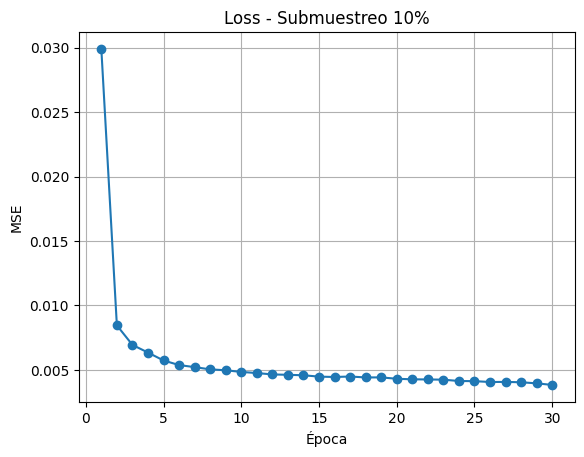

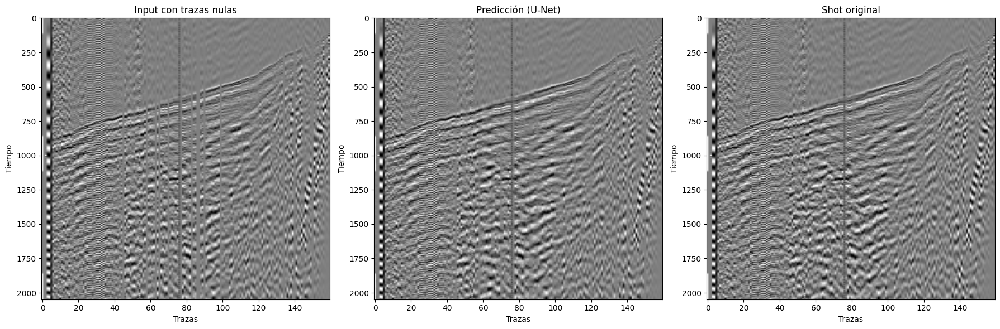


📌 Submuestreo del 20%


Submuestreo 20% - Época 30: 100%|██████████| 42/42 [00:06<00:00,  6.51it/s]


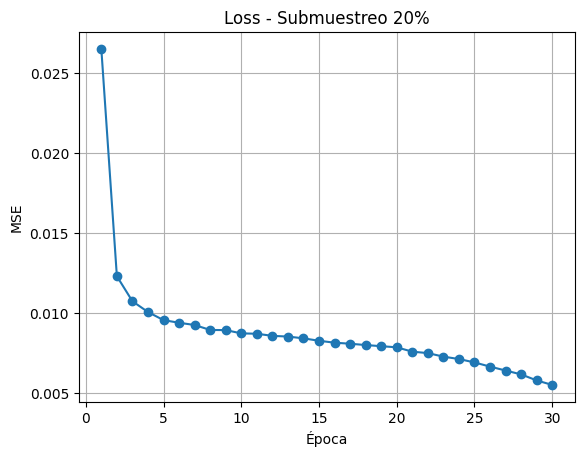

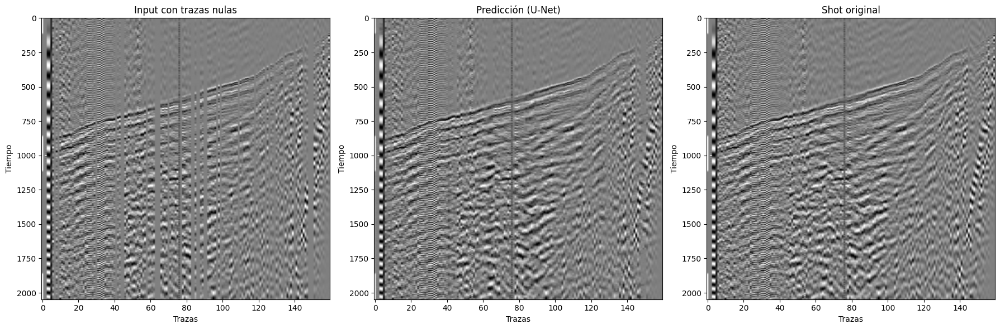


📌 Submuestreo del 30%


Submuestreo 30% - Época 30: 100%|██████████| 42/42 [00:06<00:00,  6.51it/s]


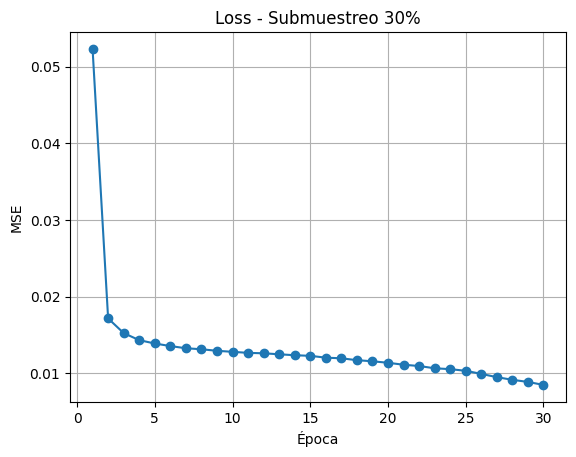

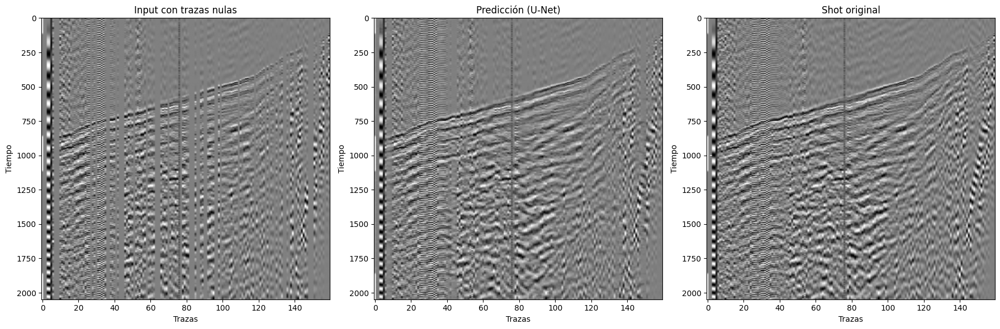


📌 Submuestreo del 40%


Submuestreo 40% - Época 30: 100%|██████████| 42/42 [00:06<00:00,  6.51it/s]


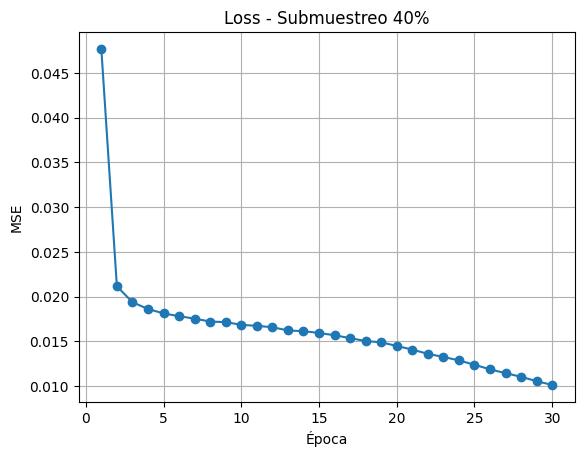

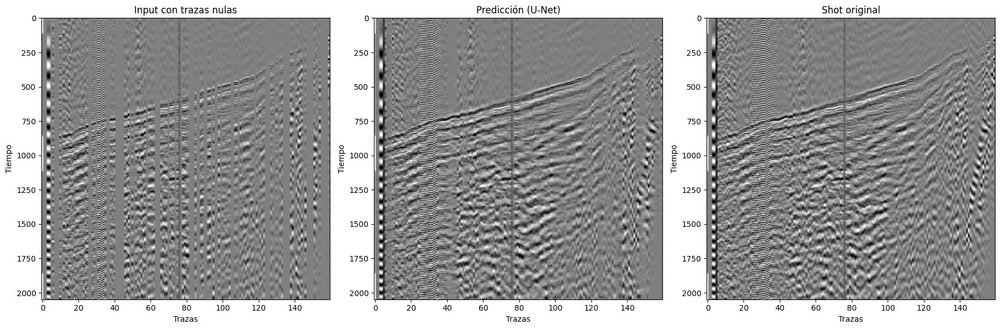


📌 Submuestreo del 50%


Submuestreo 50% - Época 30: 100%|██████████| 42/42 [00:06<00:00,  6.51it/s]


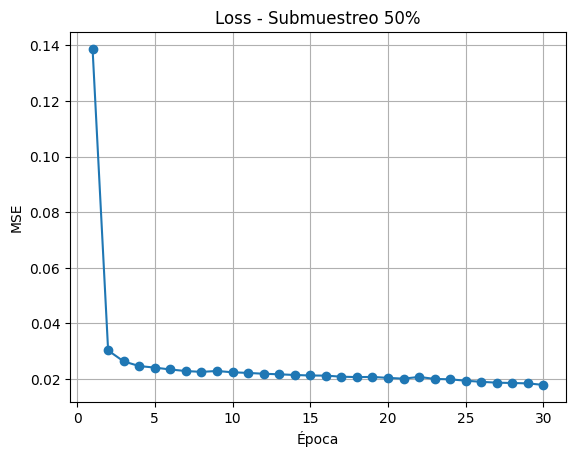

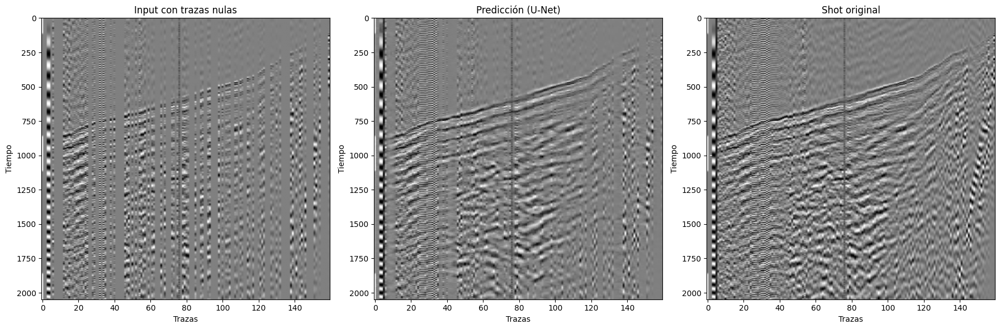


📌 Submuestreo del 60%


Submuestreo 60% - Época 30: 100%|██████████| 42/42 [00:06<00:00,  6.51it/s]


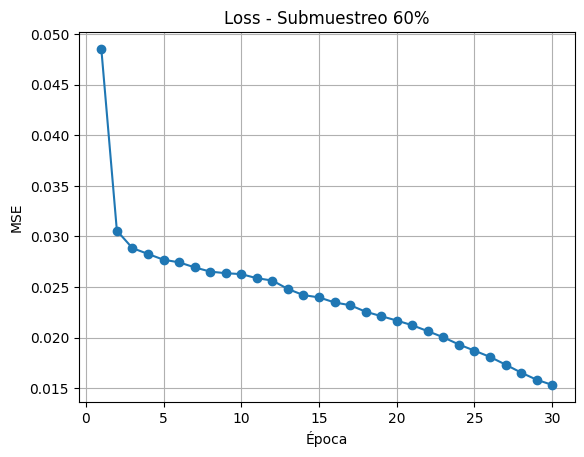

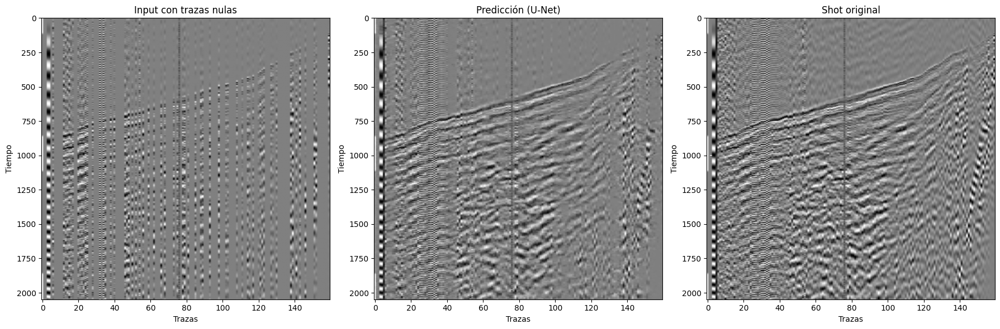


📌 Submuestreo del 70%


Submuestreo 70% - Época 30: 100%|██████████| 42/42 [00:06<00:00,  6.51it/s]


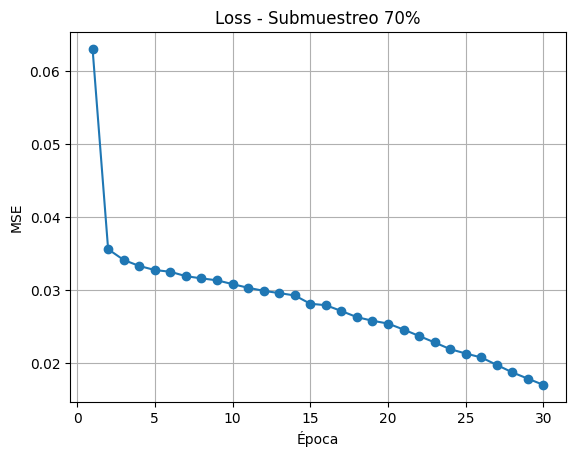

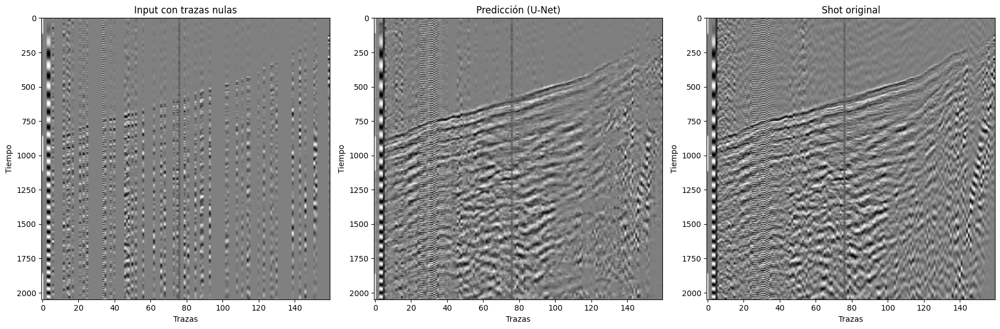


📌 Submuestreo del 80%


Submuestreo 80% - Época 30: 100%|██████████| 42/42 [00:06<00:00,  6.51it/s]


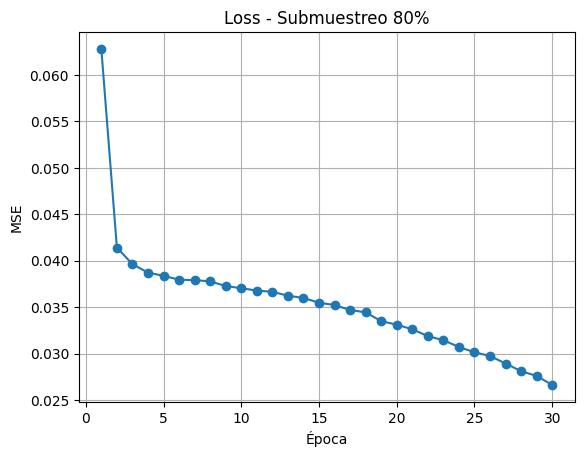

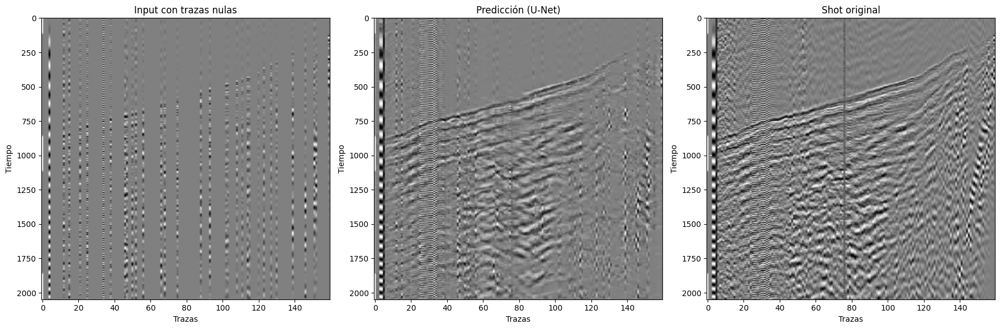


📌 Submuestreo del 90%


Submuestreo 90% - Época 30: 100%|██████████| 42/42 [00:06<00:00,  6.52it/s]


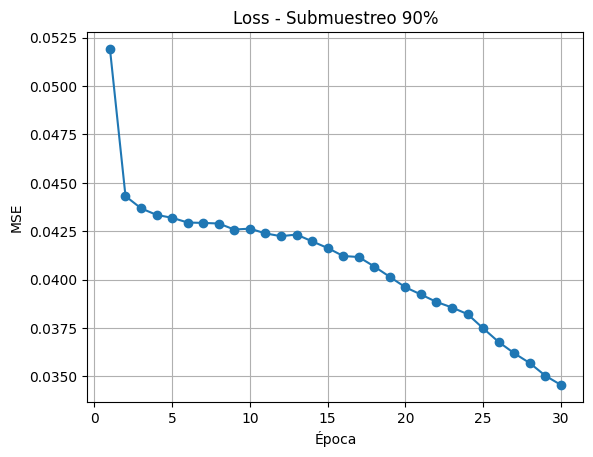

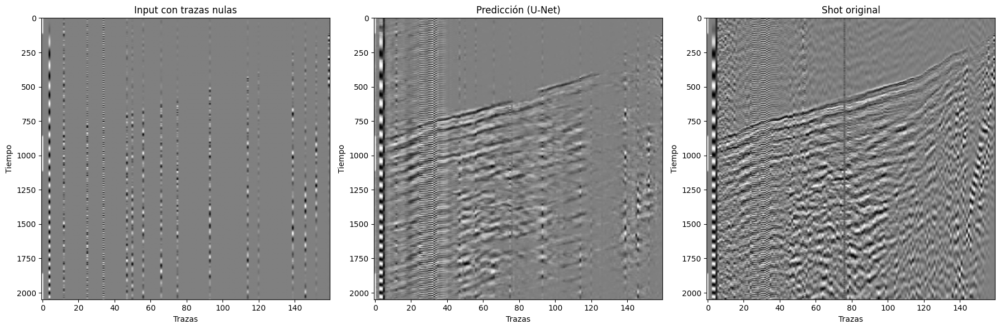

In [3]:
ruta = "/home/pc-2/Documents/CAVE_minciencias/utah_model/2D_seismic_data/2D/Correlated_Shot_Gathers"
gathers = cargar_shot_gathers(ruta, max_archivos=200)

porcentajes = list(range(10, 100, 10))
resultados_metricas = {}

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

for pct in porcentajes:
    print(f"\n📌 Submuestreo del {pct}%")
    
    # Submuestreo
    gathers_sub, idxs_removidos = submuestrear_receptores_aleatorios(gathers, porcentaje=pct/100)
    
    # Normalización
    x_np = normalizar_por_traza(gathers_sub)[:, :160, :2048]
    y_np = normalizar_por_traza(gathers)[:, :160, :2048]

    x_tensor = torch.tensor(x_np, dtype=torch.float32).unsqueeze(1).to(device)
    y_tensor = torch.tensor(y_np, dtype=torch.float32).unsqueeze(1).to(device)

    # Dataset y dataloader
    dataset = TensorDataset(x_tensor, y_tensor)
    loader = DataLoader(dataset, batch_size=4, shuffle=True)

    # Modelo
    model = UNet2DFull().to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    criterion = nn.MSELoss()
    n_epochs = 30
    loss_history = []

    # Entrenamiento
    for epoch in range(n_epochs):
        model.train()
        running_loss = 0.0
        for x_batch, y_batch in tqdm(loader, desc=f"Submuestreo {pct}% - Época {epoch+1}"):
            optimizer.zero_grad()
            y_pred = model(x_batch)
            loss = criterion(y_pred, y_batch)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
        loss_history.append(running_loss / len(loader))

    # Gráfico de pérdida
    plt.figure()
    plt.plot(range(1, n_epochs+1), loss_history, marker='o')
    plt.title(f"Loss - Submuestreo {pct}%")
    plt.xlabel("Época")
    plt.ylabel("MSE")
    plt.grid(True)
    plt.show()

    # Visualización de un shot
    idx = 50
    model.eval()
    with torch.no_grad():
        pred = model(x_tensor[idx:idx+1]).cpu().squeeze().numpy()
        entrada = x_tensor[idx, 0].cpu().numpy()
        real = y_tensor[idx, 0].cpu().numpy()
        visualizar_comparacion(entrada, pred, real)

    # Métricas
    metricas = calcular_metricas_globales(model, y_tensor, x_tensor)
    resultados_metricas[f"{pct}%"] = metricas


# Bucle final submuestreo de shots

In [4]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from skimage.metrics import structural_similarity as ssim
from math import log10
import pandas as pd
from tqdm import tqdm

def normalizar_por_traza(gathers_np):
    norm = np.max(np.abs(gathers_np), axis=2, keepdims=True) + 1e-6
    return gathers_np / norm

def submuestrear_shots(gathers, porcentaje=0.1, random_seed=42):
    np.random.seed(random_seed)
    N_shots = gathers.shape[0]
    n_eliminar = int(N_shots * porcentaje)
    idxs_eliminados = np.sort(np.random.choice(N_shots, n_eliminar, replace=False))
    gathers_sub = gathers.copy()
    gathers_sub[idxs_eliminados] = 0
    return gathers_sub, idxs_eliminados

def calcular_metricas(y_true, y_pred):
    def normalizar(x):
        return x / (np.max(np.abs(x), axis=1, keepdims=True) + 1e-6)

    y_true = normalizar(y_true)
    y_pred = normalizar(y_pred)

    mse = np.mean((y_true - y_pred)**2)
    psnr = 20 * log10(2 / np.sqrt(mse + 1e-8))
    snr = 10 * np.log10(np.mean(y_true**2) / (mse + 1e-8))
    ssim_val = np.mean([ssim(y_true[i], y_pred[i], data_range=2) for i in range(y_true.shape[0])])

    return {"MSE": mse, "PSNR": psnr, "SSIM": ssim_val, "SNR": snr}
    
def visualizar_comparacion(y_pred, y_true, shot_id=None):
    """
    Visualiza 3 paneles:
    - Reconstrucción (U-Net)
    - Shot original
    - Error absoluto (|pred - true|)

    Con colorbar en cada uno.
    """
    fig, axs = plt.subplots(1, 3, figsize=(20, 6))
    vmin, vmax = -1, 1

    def normalizar(shot):
        return shot / (np.max(np.abs(shot), axis=1, keepdims=True) + 1e-6)

    y_plot = normalizar(y_pred)
    z_plot = normalizar(y_true)
    error = np.abs(y_plot - z_plot)

    # Reconstrucción
    im0 = axs[0].imshow(y_plot.T, cmap='gray', aspect='auto', origin='upper', vmin=vmin, vmax=vmax)
    axs[0].set_title("🔁 Reconstrucción (U-Net)")
    axs[0].set_xlabel("Receptor")
    axs[0].set_ylabel("Tiempo")
    plt.colorbar(im0, ax=axs[0], fraction=0.046, pad=0.04, label="Amplitud")

    # Original
    im1 = axs[1].imshow(z_plot.T, cmap='gray', aspect='auto', origin='upper', vmin=vmin, vmax=vmax)
    axs[1].set_title("✅ Shot original")
    axs[1].set_xlabel("Receptor")
    axs[1].set_ylabel("Tiempo")
    plt.colorbar(im1, ax=axs[1], fraction=0.046, pad=0.04, label="Amplitud")

    # Diferencia
    im2 = axs[2].imshow(error.T, cmap='inferno', aspect='auto', origin='upper')
    axs[2].set_title("🟠 Error absoluto")
    axs[2].set_xlabel("Receptor")
    axs[2].set_ylabel("Tiempo")
    plt.colorbar(im2, ax=axs[2], fraction=0.046, pad=0.04, label="|Pred - Real|")

    if shot_id is not None:
        fig.suptitle(f"Comparación y error de reconstrucción — Shot #{shot_id}", fontsize=16)

    plt.tight_layout()
    plt.show()


In [5]:
class UNet2DFull(nn.Module):
    def __init__(self):
        super(UNet2DFull, self).__init__()
        self.enc1 = nn.Sequential(nn.Conv2d(1, 64, 3, padding=1), nn.BatchNorm2d(64), nn.ReLU(True),
                                  nn.Conv2d(64, 64, 3, padding=1), nn.BatchNorm2d(64), nn.ReLU(True))
        self.pool1 = nn.MaxPool2d(2)
        self.enc2 = nn.Sequential(nn.Conv2d(64, 128, 3, padding=1), nn.BatchNorm2d(128), nn.ReLU(True),
                                  nn.Conv2d(128, 128, 3, padding=1), nn.BatchNorm2d(128), nn.ReLU(True))
        self.pool2 = nn.MaxPool2d(2)
        self.enc3 = nn.Sequential(nn.Conv2d(128, 256, 3, padding=1), nn.BatchNorm2d(256), nn.ReLU(True),
                                  nn.Conv2d(256, 256, 3, padding=1), nn.BatchNorm2d(256), nn.ReLU(True))
        self.pool3 = nn.MaxPool2d(2)

        self.bottleneck = nn.Sequential(nn.Conv2d(256, 512, 3, padding=1), nn.BatchNorm2d(512), nn.ReLU(True),
                                        nn.Conv2d(512, 512, 3, padding=1), nn.BatchNorm2d(512), nn.ReLU(True))

        self.upconv3 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.dec3 = nn.Sequential(nn.Conv2d(512, 256, 3, padding=1), nn.BatchNorm2d(256), nn.ReLU(True),
                                  nn.Conv2d(256, 256, 3, padding=1), nn.BatchNorm2d(256), nn.ReLU(True))

        self.upconv2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dec2 = nn.Sequential(nn.Conv2d(256, 128, 3, padding=1), nn.BatchNorm2d(128), nn.ReLU(True),
                                  nn.Conv2d(128, 128, 3, padding=1), nn.BatchNorm2d(128), nn.ReLU(True))

        self.upconv1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec1 = nn.Sequential(nn.Conv2d(128, 64, 3, padding=1), nn.BatchNorm2d(64), nn.ReLU(True),
                                  nn.Conv2d(64, 64, 3, padding=1), nn.BatchNorm2d(64), nn.ReLU(True))

        self.final = nn.Conv2d(64, 1, kernel_size=1)

    def forward(self, x):
        e1 = self.enc1(x); p1 = self.pool1(e1)
        e2 = self.enc2(p1); p2 = self.pool2(e2)
        e3 = self.enc3(p2); p3 = self.pool3(e3)
        b = self.bottleneck(p3)
        d3 = self.dec3(torch.cat([self.upconv3(b), self.center_crop(e3, self.upconv3(b))], dim=1))
        d2 = self.dec2(torch.cat([self.upconv2(d3), self.center_crop(e2, self.upconv2(d3))], dim=1))
        d1 = self.dec1(torch.cat([self.upconv1(d2), self.center_crop(e1, self.upconv1(d2))], dim=1))
        return self.final(d1)

    @staticmethod
    def center_crop(enc_feat, target_feat):
        _, _, h, w = target_feat.shape
        _, _, H, W = enc_feat.shape
        dh, dw = (H - h) // 2, (W - w) // 2
        return enc_feat[:, :, dh:dh+h, dw:dw+w]



🔎 Submuestreo del 10% de SHOTS


Epoch 30/30: 100%|██████████| 42/42 [00:06<00:00,  6.31it/s]


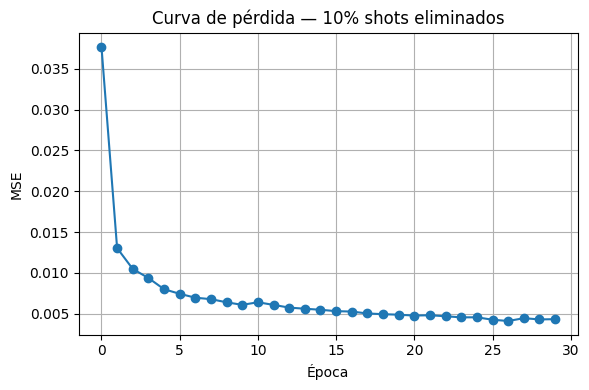

/tmp/ipykernel_83041/3434950270.py:83: UserWarning: Glyph 128257 (\N{CLOCKWISE RIGHTWARDS AND LEFTWARDS OPEN CIRCLE ARROWS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_83041/3434950270.py:83: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_83041/3434950270.py:83: UserWarning: Glyph 128992 (\N{LARGE ORANGE CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/pc-2/Documents/CAVE_minciencias/utah_model/utah_venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128257 (\N{CLOCKWISE RIGHTWARDS AND LEFTWARDS OPEN CIRCLE ARROWS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/pc-2/Documents/CAVE_minciencias/utah_model/utah_venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **

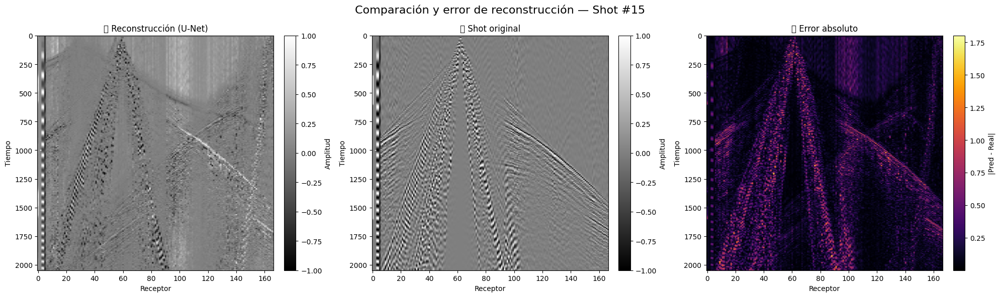


🔎 Submuestreo del 20% de SHOTS


Epoch 30/30: 100%|██████████| 42/42 [00:06<00:00,  6.30it/s]


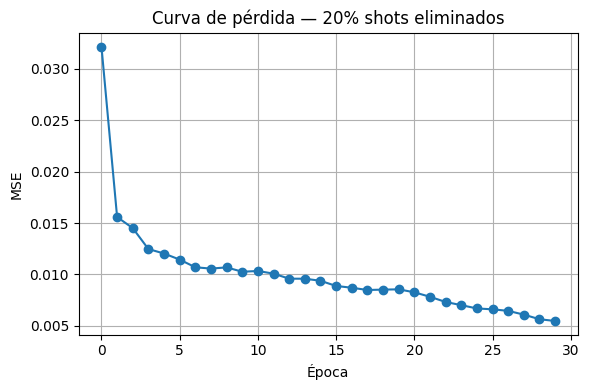

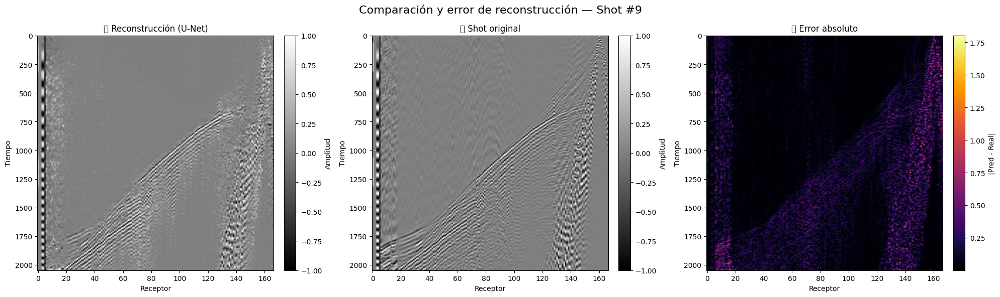


🔎 Submuestreo del 30% de SHOTS


Epoch 30/30: 100%|██████████| 42/42 [00:06<00:00,  6.30it/s]


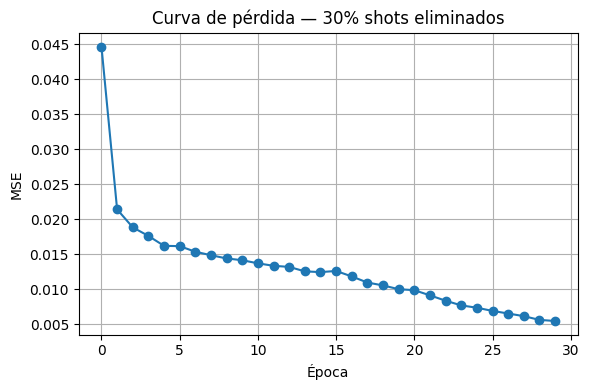

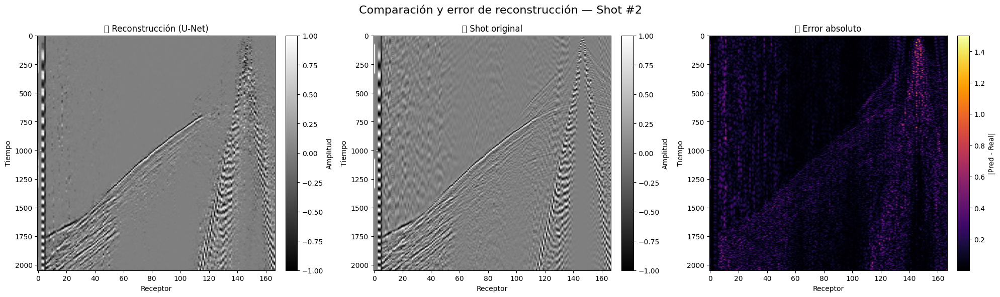


🔎 Submuestreo del 40% de SHOTS


Epoch 30/30: 100%|██████████| 42/42 [00:06<00:00,  6.31it/s]


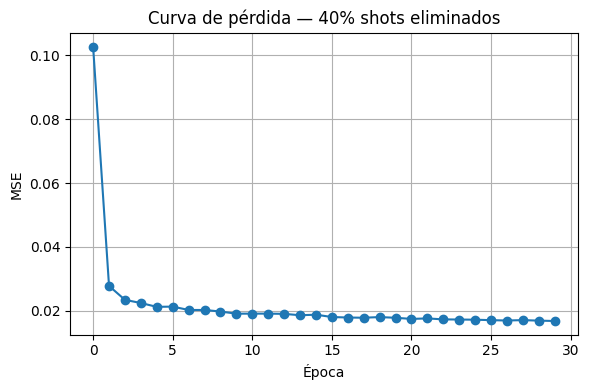

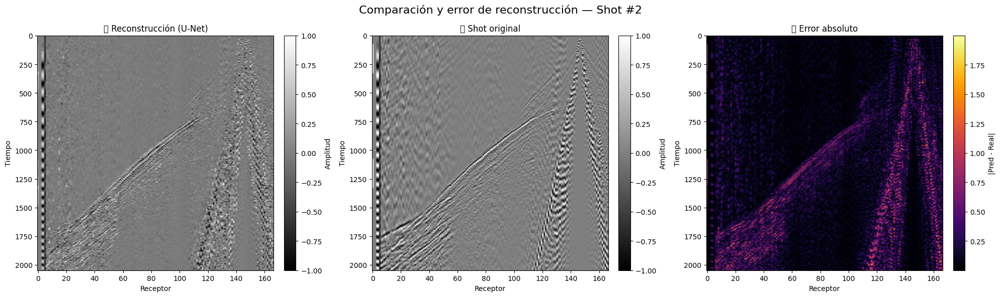


🔎 Submuestreo del 50% de SHOTS


Epoch 30/30: 100%|██████████| 42/42 [00:06<00:00,  6.30it/s]


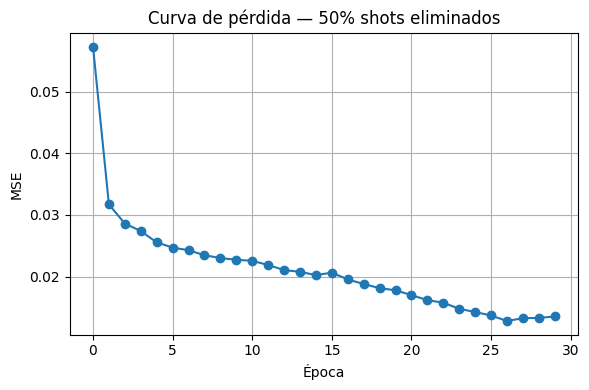

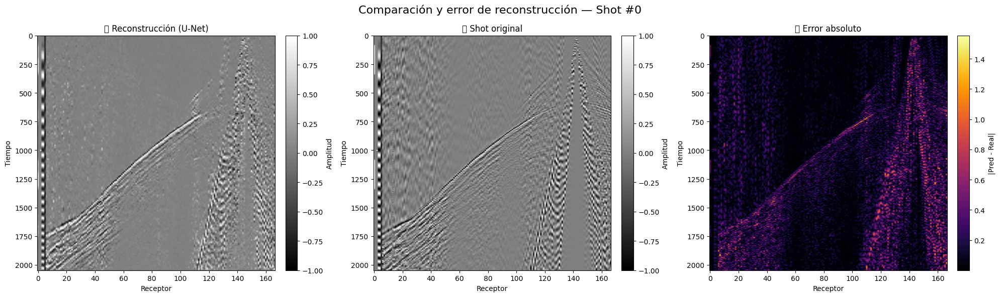


🔎 Submuestreo del 60% de SHOTS


Epoch 30/30: 100%|██████████| 42/42 [00:06<00:00,  6.30it/s]


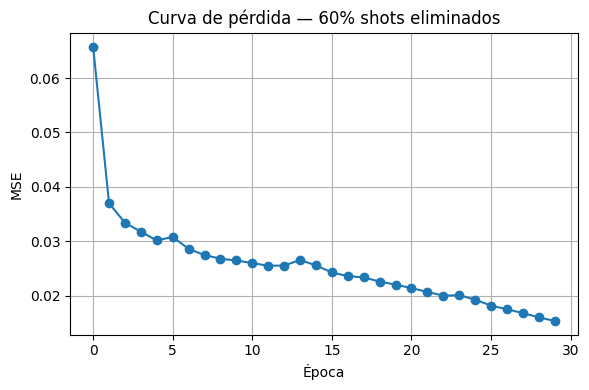

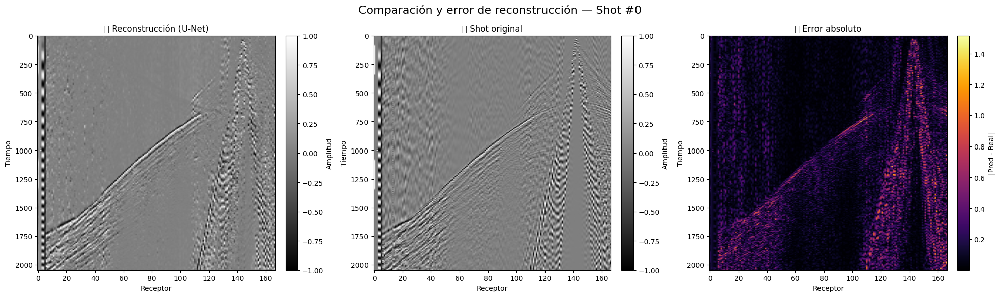


🔎 Submuestreo del 70% de SHOTS


Epoch 30/30: 100%|██████████| 42/42 [00:06<00:00,  6.30it/s]


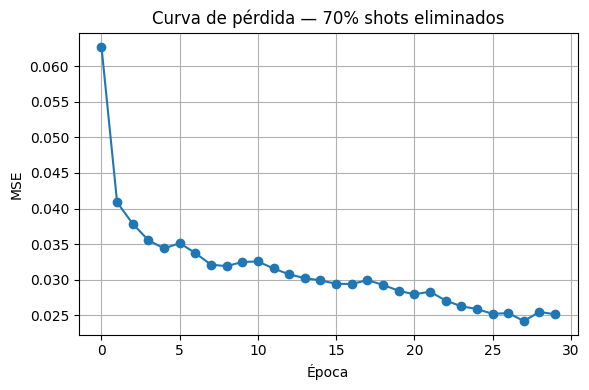

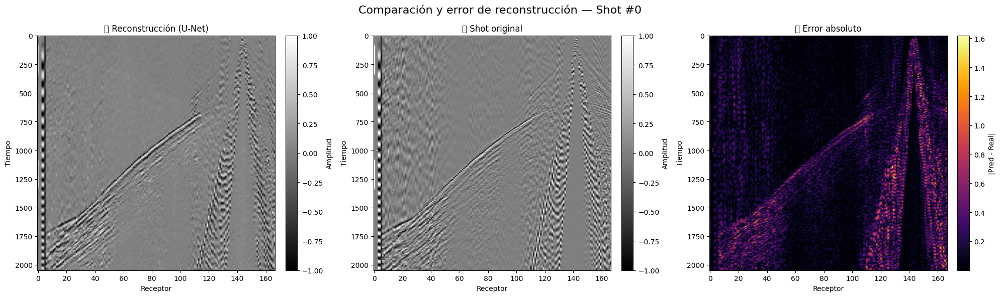


🔎 Submuestreo del 80% de SHOTS


Epoch 30/30: 100%|██████████| 42/42 [00:06<00:00,  6.30it/s]


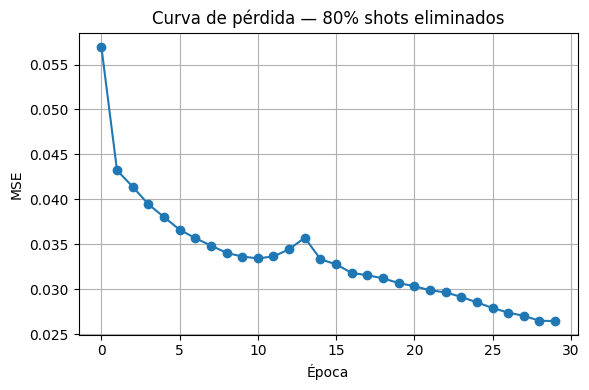

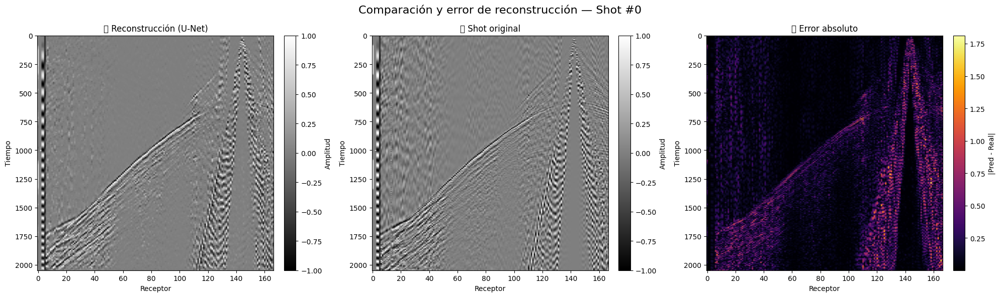


🔎 Submuestreo del 90% de SHOTS


Epoch 30/30: 100%|██████████| 42/42 [00:06<00:00,  6.30it/s]


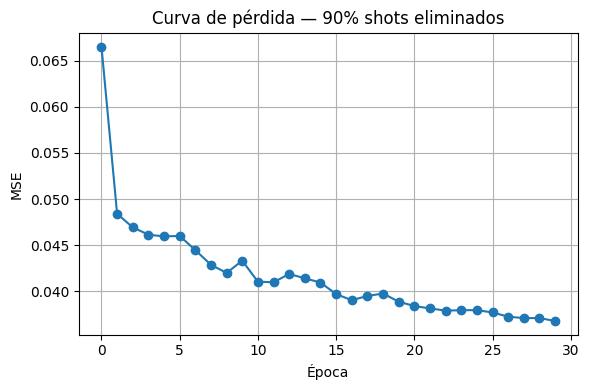

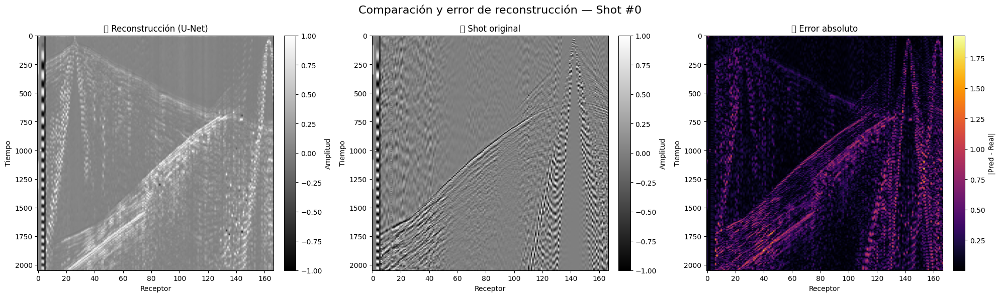

      MSE     PSNR    SSIM     SNR  Submuestreo (%)
0  0.0585  18.7487  0.1493  0.6221               10
1  0.0366  20.6345  0.2668  2.2859               20
2  0.0225  22.6806  0.3566  4.3016               30
3  0.0666  17.8986  0.1378 -0.5139               40
4  0.0317  21.1399  0.2794  2.7330               50
5  0.0343  20.8051  0.2667  2.4486               60
6  0.0498  19.2057  0.2014  0.8850               70
7  0.0511  19.0737  0.1939  0.7224               80
8  0.0727  17.5662  0.1049 -0.7397               90


In [6]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
porcentajes = range(10, 100, 10)
resultados_finales = []

for p in porcentajes:
    print(f"\n🔎 Submuestreo del {p}% de SHOTS")
    gathers_sub, idxs_removidos = submuestrear_shots(gathers, porcentaje=p/100)

    # Normalización
    x_np = normalizar_por_traza(np.transpose(gathers_sub, (1, 0, 2)))
    y_np = normalizar_por_traza(np.transpose(gathers, (1, 0, 2)))

    # Recorte
    n_shots_rec = (x_np.shape[1] // 8) * 8
    x_np = x_np[:, :n_shots_rec, :2048]
    y_np = y_np[:, :n_shots_rec, :2048]

    x_tensor = torch.tensor(x_np, dtype=torch.float32).unsqueeze(1).to(device)
    y_tensor = torch.tensor(y_np, dtype=torch.float32).unsqueeze(1).to(device)

    # Dataset
    dataset = TensorDataset(x_tensor, y_tensor)
    loader = DataLoader(dataset, batch_size=4, shuffle=True)

    # Entrenamiento
    model = UNet2DFull().to(device)
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    loss_history = []

    for epoch in range(30):
        model.train()
        loss_epoch = 0.0
        for xb, yb in tqdm(loader, desc=f"Epoch {epoch+1}/30"):
            xb, yb = xb.to(device), yb.to(device)
            optimizer.zero_grad()
            pred = model(xb)
            loss = criterion(pred, yb)
            loss.backward()
            optimizer.step()
            loss_epoch += loss.item()
        loss_history.append(loss_epoch / len(loader))

    # Graficar pérdida
    plt.figure(figsize=(6, 4))
    plt.plot(loss_history, marker='o')
    plt.title(f"Curva de pérdida — {p}% shots eliminados")
    plt.xlabel("Época"); plt.ylabel("MSE"); plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Reconstrucción y evaluación
    # Inferencia por lotes
    loader_eval = DataLoader(x_tensor, batch_size=4, shuffle=False)
    preds = []

    model.eval()
    with torch.no_grad():
        for xb in loader_eval:
            xb = xb.to(device)
            pred = model(xb).cpu().squeeze(1)  # (B, H, W)
            preds.append(pred)

    # Unir todos los batches
    preds = torch.cat(preds, dim=0).numpy()  # (N, H, W)

    # Volver a domain de SHOTs
    recon = np.transpose(preds, (1, 0, 2))

    # Métricas promedio sobre los shots eliminados
    metrics = []
    for idx in idxs_removidos:
        if idx < recon.shape[0]:
            gt = gathers[idx][:, :2048]
            pred = recon[idx]
            met = calcular_metricas(gt, pred)
            metrics.append(met)

    # Promedio
    df = pd.DataFrame(metrics)
    prom = df.mean().to_dict()
    prom["Submuestreo (%)"] = p
    resultados_finales.append(prom)

    gathers_reconstruidos = np.transpose(preds, (1, 0, 2))

    shot_idx = idxs_removidos[0]
    original = gathers[shot_idx][:, :2048]
    reconstruido = gathers_reconstruidos[shot_idx]
    visualizar_comparacion(reconstruido, original, shot_id=shot_idx)

# Mostrar tabla resumen
df_resumen = pd.DataFrame(resultados_finales)
print(df_resumen.round(4))
